# Challenge 1. Classification Machine Learning Model.

## 1. Data Handling & Preparation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif
from skrebate import ReliefF
from scipy import stats
from mrmr import mrmr_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [2]:
CSVMetaData = '../datasets/ACDC_radiomics.csv'
data=pd.read_csv(CSVMetaData)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 645 entries, original_shape_Elongation_LV_ED to class
dtypes: float64(601), int64(43), object(1)
memory usage: 504.0+ KB


## Feature selection
### Data preparation

In [4]:
# Select only numerical features and create 2 dataframes for X and y
#y = pd.DataFrame(data["class"])
y = data["class"]
X = data.select_dtypes(include=[np.number])
X = X.astype('float64')

In [5]:
# Split the data into training and testing set. Here, we will follow a simple approach of using 80% of data for training and 20% for testing.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

In [6]:
# Enconde categorical features
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]], dtype=np.float64)
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res)

In [7]:
# Normalize the numerical values using MinMaxScaler for train and test data
num_preprocessor = MinMaxScaler()
X_train[:]= num_preprocessor.fit_transform(X_train)
X_test[:] = num_preprocessor.transform(X_test)

In [8]:
# Define transform for the target labels
label_encode = LabelEncoder()
# Fit and transform the training data
y_train[:] = label_encode.fit_transform(y_train)
# Transform the testing data
y_test[:]= label_encode.transform(y_test)

In [9]:
print(X_train.head(5))
y_train= y_train.astype('float64')

    original_shape_Elongation_LV_ED  original_shape_Flatness_LV_ED  \
55                         0.545540                       0.181458   
88                         0.594435                       0.127290   
26                         0.662534                       0.197536   
42                         0.585371                       0.639784   
69                         0.592289                       0.246663   

    original_shape_LeastAxisLength_LV_ED  \
55                              0.202413   
88                              0.093455   
26                              0.157813   
42                              0.396580   
69                              0.129658   

    original_shape_MajorAxisLength_LV_ED  \
55                              0.275422   
88                              0.197263   
26                              0.178059   
42                              0.012701   
69                              0.069826   

    original_shape_Maximum2DDiameterColumn_LV_ED 

In [10]:
# Review the number of samples, features, types of data, target values before proceeding with feature selection
print(y_train.shape)
print(X_train.shape)
print(X_train.dtypes)
np.unique(y_train)

(80,)
(80, 644)
original_shape_Elongation_LV_ED                 float64
original_shape_Flatness_LV_ED                   float64
original_shape_LeastAxisLength_LV_ED            float64
original_shape_MajorAxisLength_LV_ED            float64
original_shape_Maximum2DDiameterColumn_LV_ED    float64
                                                 ...   
original_ngtdm_Complexity_MYO_ES                float64
original_ngtdm_Contrast_MYO_ES                  float64
original_ngtdm_Strength_MYO_ES                  float64
height                                          float64
weight                                          float64
Length: 644, dtype: object


array([0., 1., 2., 3., 4.])

## Univariate Filter Methods
### K-Best

Select features based on the k-highest scores. SelectKBest offers several evaluation methods ([ANOVA f statistic](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_classif.html#sklearn-feature-selection-f-classif), [chi2](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html#sklearn-feature-selection-chi2), [mutual_info_classif](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html#sklearn-feature-selection-mutual-info-classif) etc.).

In [11]:
# Configure to select all features
fs1 = SelectKBest(score_func=f_classif, k = 'all')
# Learn relationship from training data
fs1 = fs1.fit(X_train, y_train)
# Transform train data
X_train_fs = fs1.transform(X_train)
# Transform test data
X_test_fs = fs1.transform(X_test)

# Get the pvalues
kbest_scores = -np.log10(fs1.pvalues_)
cols = fs1.get_support(indices=False)
# Selected_columns
print(sum((cols)))
# Normalize
kbest_scores /= kbest_scores.max()

644


Number of features: 103


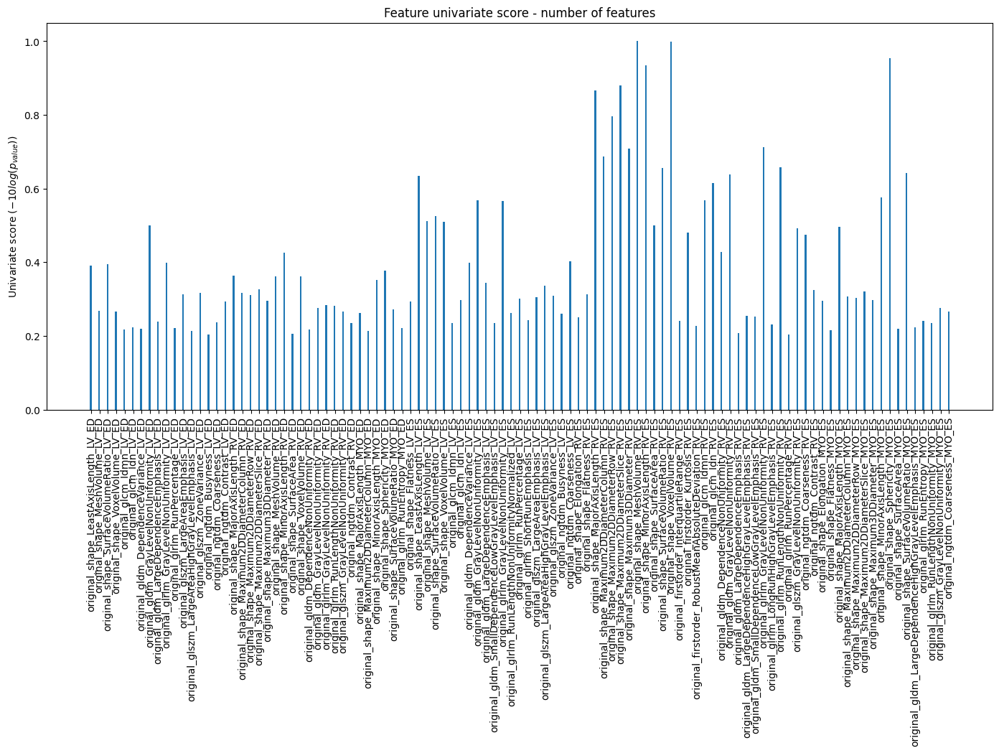

In [12]:
# Keep only the features with p-value below a threshold
cols = np.where(fs1.pvalues_<0.001)[0]
temp = X_train.iloc[:,cols]
X_indices = np.arange(temp.shape[-1])
print("Number of features:", temp.shape[1])
# Create the plot
plt.figure(figsize=(17,7))
plt.figure(1)
plt.clf()
plt.bar(X_indices - 0.05, kbest_scores[cols], width=0.2)
plt.title("Feature univariate score - number of features")
plt.xticks(range(0,len(cols)),X_train.columns[cols], rotation=90)
plt.ylabel("Univariate score ($-10 log(p_{value})$)")
plt.show()

In [13]:
# We can re-run transform or just get the features using cols
fs_kbest = SelectKBest(score_func=f_classif, k = len(cols))
# Learn relationship from training data
fs_kbest = fs_kbest.fit(X_train, y_train)
# Transform the train and test data
X_train_kbest = fs_kbest.transform(X_train)
X_test_kbest = fs_kbest.transform(X_test)
# The number of the retained features
print("Number of retained features: ", X_train_kbest.shape[1])

Number of retained features:  103


In [14]:
# Add features in a list for use later with the ensemble model
cols= fs_kbest.get_support()
features_K_best = []
features_K_best.append(list(X_train.columns[cols]))
print(features_K_best)

[['original_shape_LeastAxisLength_LV_ED', 'original_shape_MeshVolume_LV_ED', 'original_shape_SurfaceVolumeRatio_LV_ED', 'original_shape_VoxelVolume_LV_ED', 'original_glcm_Idmn_LV_ED', 'original_glcm_Idn_LV_ED', 'original_gldm_DependenceVariance_LV_ED', 'original_gldm_GrayLevelNonUniformity_LV_ED', 'original_gldm_LargeDependenceEmphasis_LV_ED', 'original_glrlm_GrayLevelNonUniformity_LV_ED', 'original_glrlm_RunPercentage_LV_ED', 'original_glszm_LargeAreaEmphasis_LV_ED', 'original_glszm_LargeAreaHighGrayLevelEmphasis_LV_ED', 'original_glszm_ZoneVariance_LV_ED', 'original_ngtdm_Busyness_LV_ED', 'original_ngtdm_Coarseness_LV_ED', 'original_ngtdm_Contrast_LV_ED', 'original_shape_MajorAxisLength_RV_ED', 'original_shape_Maximum2DDiameterColumn_RV_ED', 'original_shape_Maximum2DDiameterRow_RV_ED', 'original_shape_Maximum2DDiameterSlice_RV_ED', 'original_shape_Maximum3DDiameter_RV_ED', 'original_shape_MeshVolume_RV_ED', 'original_shape_MinorAxisLength_RV_ED', 'original_shape_SurfaceArea_RV_ED', '

In [15]:
features_selected_lists= []
features_selected_lists.append(features_K_best[0])

## Multivariate filter methods
### ReliefF

Relief is a feature selection algorithm that evaluates the importance of features by measuring their ability to distinguish between instances that are near each other. For each data point, it compares the values of its nearest neighbor from the same class (hit) and from a different class (miss). Features that contribute more to separating instances of different classes receive higher relevance scores. Relief is particularly effective for capturing feature interactions and works well in high-dimensional biomedical datasets.

In [16]:
#!pip install skrebate

In [17]:
# Number of features to retain
n_features = 103
# Define the transform
reliefFS = ReliefF(n_features_to_select=n_features, n_neighbors=100, n_jobs = -1)
# Learn and apply to the train data
X_train_relief = reliefFS.fit_transform(X_train.values, y_train.values)
print("Number of features before feature selection) : ", X_train.shape)
print("Number of features after Relief feature selection) : ", X_train_relief.shape)
# Apply to the test data
X_test_relief = reliefFS.transform(X_test.values)

Number of features before feature selection) :  (80, 644)
Number of features after Relief feature selection) :  (80, 103)


In [18]:
# Scores
relief_scores = reliefFS.feature_importances_
print(relief_scores)

[0.01995559 0.03395747 0.05522839 0.01291938 0.00597934 0.01258243
 0.0130412  0.01214979 0.05015899 0.01337459 0.03546959 0.01842639
 0.05589876 0.04999572 0.01002113 0.0209596  0.00836499 0.03879539
 0.02649839 0.00999048 0.01883609 0.02698734 0.01971017 0.02217537
 0.01337525 0.02004791 0.02756115 0.02053252 0.00995613 0.00836499
 0.04673776 0.01448603 0.01224704 0.00545833 0.00472558 0.01317629
 0.01166783 0.01456389 0.02479221 0.03624816 0.01054332 0.03868195
 0.03927321 0.04195745 0.04424317 0.01543117 0.01325576 0.01148657
 0.02287846 0.04114982 0.03662418 0.01107941 0.03887692 0.02287846
 0.03761627 0.01283582 0.02968357 0.02078592 0.03117088 0.05045767
 0.07259608 0.01444193 0.01212665 0.05276842 0.02295262 0.04303274
 0.02685024 0.03119294 0.00686893 0.01476711 0.06024381 0.05005817
 0.01458396 0.01162315 0.03108901 0.01332284 0.03208521 0.02519723
 0.02634421 0.01587606 0.05111497 0.05052667 0.02976103 0.0525716
 0.0110603  0.01960897 0.02610858 0.02215318 0.00873639 0.00956

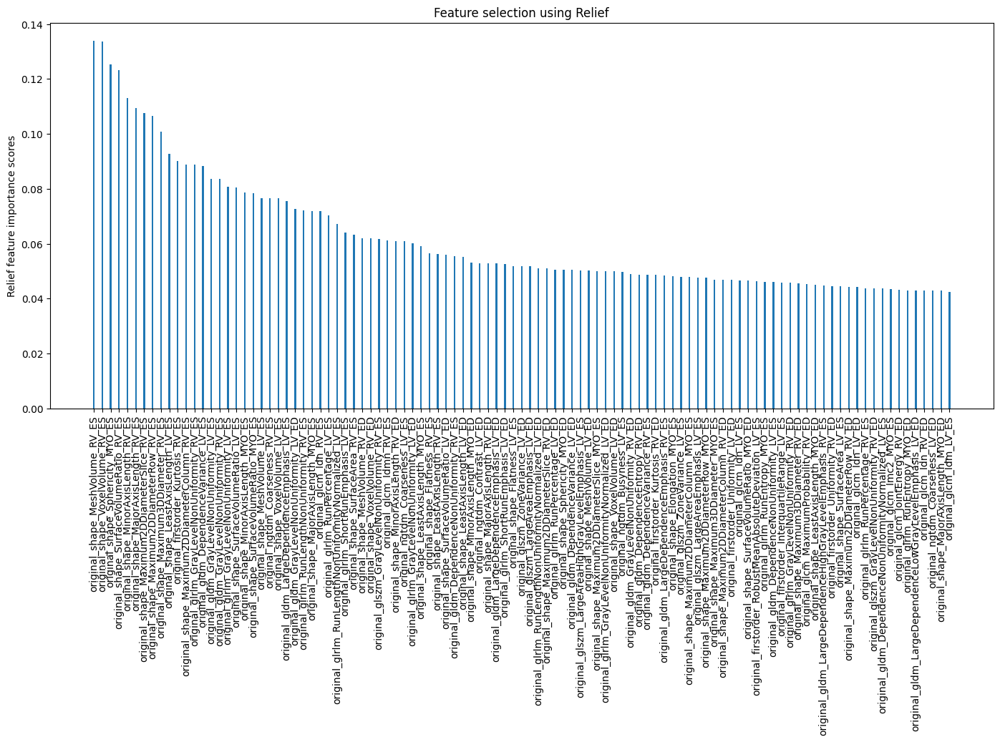

In [19]:
# Keep the n most important
cols = reliefFS.top_features_
feat = cols[:n_features]
# Create the plot
plt.figure(figsize=(17,7))
plt.figure(1)
plt.clf()
plt.bar(range(0, len(relief_scores[feat])), relief_scores[feat], width=0.2)
plt.title("Feature selection using Relief")
plt.xticks(range(0, len(relief_scores[feat])),X_train.columns[feat], rotation=90)
plt.ylabel("Relief feature importance scores")
plt.show()

In [20]:
# Add features in a list for use later with the ensemble model
features_relief_best = []
features_relief_best.append(list(X_train.columns[feat]))
features_selected_lists.append(features_relief_best[0])

In [21]:
# Create a dataframe that contains the scores of the two methods and feature names
feature_names = X_train.columns
df=pd.DataFrame({'Kbest':kbest_scores,'ReliefF':relief_scores,'Feature':feature_names})
df.set_index('Feature', inplace = True)
df.sort_values('Kbest', inplace = True, ascending = False)

In [22]:
# Use spearman correlation
stats.spearmanr(relief_scores, kbest_scores)

SignificanceResult(statistic=0.8854933554359032, pvalue=7.026040806657247e-216)

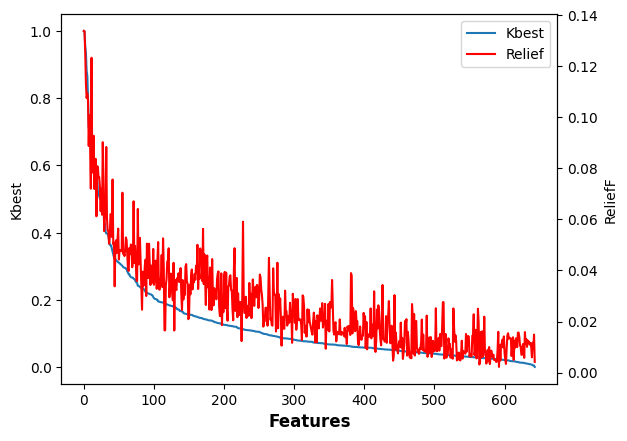

In [23]:
fig, ax = plt.subplots()
rr = range(0,len(feature_names))
# Create a twin Axes sharing the xaxis
ax2 = ax.twinx()
ax.plot(range(0,df.shape[0]), df["Kbest"], label='Kbest')
ax2.plot(range(0,df.shape[0]), df["ReliefF"], color='red', label='Relief')

ax.set_xlabel('Features', fontsize=12, fontweight='bold')
ax.set_ylabel('Kbest')
ax2.set_ylabel('ReliefF')
fig.legend(loc="upper right", bbox_to_anchor=(1,1), bbox_transform=ax.transAxes)

In [24]:
# Intersección
common_features = np.intersect1d(features_K_best, features_relief_best)

print(f"Common features between KBest and ReliefF: {len(common_features)}")
print(common_features)

Common features between KBest and ReliefF: 81
['original_firstorder_Kurtosis_RV_ES' 'original_glcm_Idmn_RV_ES'
 'original_glcm_Idn_LV_ED' 'original_glcm_Idn_LV_ES'
 'original_glcm_Idn_RV_ES' 'original_gldm_DependenceNonUniformity_RV_ES'
 'original_gldm_DependenceVariance_LV_ED'
 'original_gldm_DependenceVariance_LV_ES'
 'original_gldm_GrayLevelNonUniformity_LV_ED'
 'original_gldm_GrayLevelNonUniformity_LV_ES'
 'original_gldm_GrayLevelNonUniformity_RV_ED'
 'original_gldm_GrayLevelNonUniformity_RV_ES'
 'original_gldm_LargeDependenceEmphasis_LV_ED'
 'original_gldm_LargeDependenceEmphasis_LV_ES'
 'original_gldm_LargeDependenceEmphasis_RV_ES'
 'original_gldm_LargeDependenceHighGrayLevelEmphasis_RV_ES'
 'original_glrlm_GrayLevelNonUniformity_LV_ED'
 'original_glrlm_GrayLevelNonUniformity_LV_ES'
 'original_glrlm_GrayLevelNonUniformity_RV_ED'
 'original_glrlm_GrayLevelNonUniformity_RV_ES'
 'original_glrlm_RunEntropy_MYO_ED' 'original_glrlm_RunEntropy_MYO_ES'
 'original_glrlm_RunLengthNonUnifor

## Minimum redundancy maximum relevance

In [25]:
#!pip install mrmr_selection

In [26]:
# Use mrmr classification
selected_features = mrmr_classif(X_train, y_train, K = 10)
print(selected_features)

100%|██████████| 10/10 [00:00<00:00, 23.98it/s]

['original_shape_MeshVolume_RV_ES', 'original_firstorder_Entropy_RV_ES', 'original_gldm_SmallDependenceLowGrayLevelEmphasis_LV_ES', 'original_shape_Sphericity_MYO_ES', 'original_shape_VoxelVolume_RV_ES', 'original_shape_LeastAxisLength_LV_ES', 'original_shape_MinorAxisLength_RV_ES', 'original_glcm_Imc1_MYO_ES', 'original_shape_SurfaceVolumeRatio_LV_ES', 'original_shape_Maximum2DDiameterSlice_RV_ES']


In [27]:
# Retain only those features for the training data
X_train_mrmr = X_train.loc[:,selected_features]
# Retain only those features for the testing data
X_test_mrmr = X_test.loc[:,selected_features]

In [28]:
features_selected_lists.append(list(selected_features))

## Wrapper methods

In [29]:
knn = KNeighborsClassifier(n_neighbors=4)

In [30]:
# Sequential feature selection
sfs1 = SFS(knn,
           k_features='best',
           forward=True,
           floating=False,
           verbose=0,
           scoring='accuracy',
           cv=3)

sfs1 = sfs1.fit(X_train, y_train)

In [31]:
sfs1.subsets_

{1: {'feature_idx': (545,),
  'cv_scores': array([0.48148148, 0.55555556, 0.57692308]),
  'avg_score': 0.5379867046533713,
  'feature_names': ('original_shape_Sphericity_MYO_ES',)},
 2: {'feature_idx': (391, 545),
  'cv_scores': array([0.59259259, 0.74074074, 0.73076923]),
  'avg_score': 0.6880341880341879,
  'feature_names': ('original_glrlm_GrayLevelNonUniformity_LV_ES',
   'original_shape_Sphericity_MYO_ES')},
 3: {'feature_idx': (391, 545, 626),
  'cv_scores': array([0.74074074, 0.74074074, 0.76923077]),
  'avg_score': 0.7502374169040835,
  'feature_names': ('original_glrlm_GrayLevelNonUniformity_LV_ES',
   'original_shape_Sphericity_MYO_ES',
   'original_glszm_LargeAreaHighGrayLevelEmphasis_MYO_ES')},
 4: {'feature_idx': (391, 436, 545, 626),
  'cv_scores': array([0.74074074, 0.74074074, 0.80769231]),
  'avg_score': 0.7630579297245964,
  'feature_names': ('original_glrlm_GrayLevelNonUniformity_LV_ES',
   'original_shape_MeshVolume_RV_ES',
   'original_shape_Sphericity_MYO_ES',
   

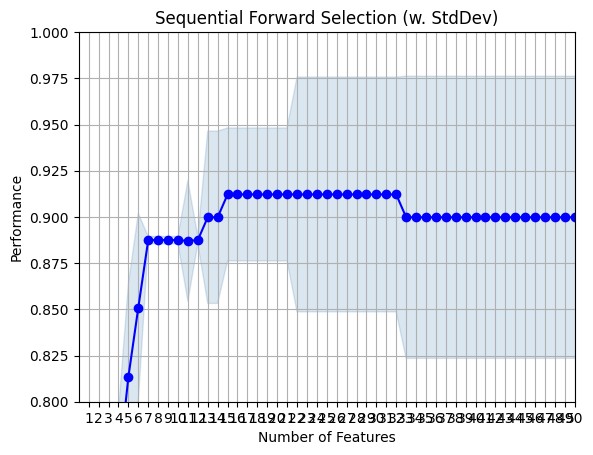

In [32]:
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev')
plt.ylim([0.8, 1])
plt.xlim([0, 50])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [33]:
results = pd.DataFrame.from_dict(sfs1.get_metric_dict()).T
# See the first rows of the results
results.head(20)
#sfs1.get_metric_dict()

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(545,)","[0.48148148148148145, 0.5555555555555556, 0.57...",0.537987,"(original_shape_Sphericity_MYO_ES,)",0.09203,0.040896,0.028918
2,"(391, 545)","[0.5925925925925926, 0.7407407407407407, 0.730...",0.688034,"(original_glrlm_GrayLevelNonUniformity_LV_ES, ...",0.152145,0.06761,0.047808
3,"(391, 545, 626)","[0.7407407407407407, 0.7407407407407407, 0.769...",0.750237,"(original_glrlm_GrayLevelNonUniformity_LV_ES, ...",0.030223,0.01343,0.009497
4,"(391, 436, 545, 626)","[0.7407407407407407, 0.7407407407407407, 0.807...",0.763058,"(original_glrlm_GrayLevelNonUniformity_LV_ES, ...",0.071023,0.031561,0.022317
5,"(391, 436, 472, 545, 626)","[0.7777777777777778, 0.7777777777777778, 0.884...",0.81339,"(original_glrlm_GrayLevelNonUniformity_LV_ES, ...",0.113335,0.050364,0.035613
6,"(329, 391, 436, 472, 545, 626)","[0.8148148148148148, 0.8148148148148148, 0.923...",0.850902,"(original_shape_MeshVolume_LV_ES, original_glr...",0.114846,0.051035,0.036087
7,"(218, 329, 391, 436, 472, 545, 626)","[0.8888888888888888, 0.8888888888888888, 0.884...",0.887464,(original_shape_Maximum2DDiameterColumn_MYO_ED...,0.004533,0.002015,0.001425
8,"(198, 218, 329, 391, 436, 472, 545, 626)","[0.8888888888888888, 0.8888888888888888, 0.884...",0.887464,(original_glszm_LargeAreaHighGrayLevelEmphasis...,0.004533,0.002015,0.001425
9,"(198, 218, 329, 391, 436, 472, 518, 545, 626)","[0.8888888888888888, 0.8888888888888888, 0.884...",0.887464,(original_glszm_LargeAreaHighGrayLevelEmphasis...,0.004533,0.002015,0.001425
10,"(198, 218, 329, 391, 436, 472, 518, 519, 545, ...","[0.8888888888888888, 0.8888888888888888, 0.884...",0.887464,(original_glszm_LargeAreaHighGrayLevelEmphasis...,0.004533,0.002015,0.001425


In [34]:
# Transform the training data
X_train_sfs = sfs1.transform(X_train)
# Transform the testing data
X_test_sfs = sfs1.transform(X_test)

In [35]:
len(sfs1.k_feature_names_)

15

In [36]:
# Append features
features_selected_lists.append(list(sfs1.k_feature_names_))

## Hybrid
### Ensemble methods

Intersection & Union

In [37]:
features_selected_sets = []
for features_list in features_selected_lists:
    features_selected_sets.append(set(features_list))
# Intersection
intersection = set.intersection(*features_selected_sets)
print('Intersection', intersection)
# Union
union = list(set.union(*features_selected_sets))
print('Union', union)

Intersection {'original_shape_Sphericity_MYO_ES', 'original_shape_MeshVolume_RV_ES'}
Union ['original_glrlm_ShortRunEmphasis_LV_ES', 'original_shape_MeshVolume_RV_ES', 'original_gldm_DependenceEntropy_RV_ED', 'original_gldm_DependenceVariance_LV_ES', 'original_ngtdm_Busyness_LV_ES', 'original_firstorder_Kurtosis_RV_ED', 'original_shape_Maximum2DDiameterRow_RV_ED', 'original_glcm_Idmn_RV_ES', 'original_shape_MinorAxisLength_MYO_ED', 'original_glcm_Idn_RV_ED', 'original_glcm_JointEnergy_RV_ED', 'original_glcm_Imc1_MYO_ES', 'original_shape_SurfaceVolumeRatio_RV_ES', 'original_shape_MinorAxisLength_RV_ED', 'original_glrlm_RunLengthNonUniformityNormalized_LV_ED', 'original_shape_VoxelVolume_LV_ES', 'original_glcm_Idmn_LV_ES', 'original_firstorder_Uniformity_RV_ED', 'original_shape_SurfaceVolumeRatio_LV_ED', 'original_glcm_Idmn_LV_ED', 'original_glszm_LargeAreaHighGrayLevelEmphasis_LV_ES', 'original_gldm_SmallDependenceLowGrayLevelEmphasis_LV_ES', 'original_shape_SurfaceVolumeRatio_MYO_ED', 

In [38]:
from collections import Counter
flat_list = [item for sublist in features_selected_lists for item in sublist]
min_votes = 3
counter = Counter(list(flat_list)) # list of lists
features_voted = [k for k, v in counter.items() if v >= min_votes]
print("Final features after voting:", features_voted)
print("Number of final features after voting:", len(features_voted))

Final features after voting: ['original_glszm_LargeAreaEmphasis_LV_ED', 'original_shape_MeshVolume_RV_ED', 'original_shape_LeastAxisLength_LV_ES', 'original_shape_MeshVolume_LV_ES', 'original_shape_SurfaceVolumeRatio_LV_ES', 'original_shape_VoxelVolume_LV_ES', 'original_glrlm_GrayLevelNonUniformity_LV_ES', 'original_shape_Flatness_RV_ES', 'original_shape_Maximum2DDiameterSlice_RV_ES', 'original_shape_MeshVolume_RV_ES', 'original_shape_MinorAxisLength_RV_ES', 'original_shape_VoxelVolume_RV_ES', 'original_glcm_Idn_RV_ES', 'original_shape_Sphericity_MYO_ES']
Number of final features after voting: 14


In [39]:
# Add them in the list of lists
features_selected_lists.append(union)
features_selected_lists.append(features_voted)
# Total number of feature combinations
print(len(features_selected_lists))

6


## Comparison among all methods using classification

In [40]:
y_test = np.array(y_test).astype(int)

In [41]:
#Training
models = []
models_features = []
fs_technique = ['kbest', 'Relief','mRMR','SFS','Union', 'Voting']
for i, features_list in enumerate(features_selected_lists):
    clf = knn
    # Train the machine learning model
    clf.fit(X_train[features_list], y_train)
    # Predict the outcome for the test set
    y_pred = clf.predict(X_test[features_list])
    # Calculate and print the classication report including
    print('Classification report for testing data ' + fs_technique[i])
    print(classification_report(y_test, y_pred)) # attention! - order of arguments matters!

Classification report for testing data kbest
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      0.60      0.75         5
           2       0.67      0.67      0.67         3
           3       0.50      0.75      0.60         4
           4       1.00      1.00      1.00         3

    accuracy                           0.80        20
   macro avg       0.83      0.80      0.80        20
weighted avg       0.85      0.80      0.81        20

Classification report for testing data Relief
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      0.80      0.89         5
           2       0.43      1.00      0.60         3
           3       0.33      0.25      0.29         4
           4       1.00      0.33      0.50         3

    accuracy                           0.70        20
   macro avg       0.75      0.68      0

When comparing the performance of different feature selection techniques applied to the ACDC dataset, it is observed that the mRMR method (Minimum Redundancy Maximum Relevance) offers the best overall performance. With an accuracy of 95% and a macro F1-score also of 0.95, it consistently outperforms the other approaches, achieving excellent classification even for the less represented classes. Techniques such as SFS (Sequential Forward Selection) and KBest also show solid results, with accuracies of 85% and 80% respectively, although they exhibit a slight decrease in generalization capacity for some classes. In contrast, methods like Relief, Union, and Voting show lower performance, especially in terms of recall for intermediate classes, suggesting less stability or discriminative power in this context. Based on these results, it is concluded that mRMR is the most effective technique for this dataset and model configuration.

In [42]:
# Save X with de most relevant features
X_feature_select= X.loc[:,selected_features]
np.save("../datasets/X_feature_select.npy", X_feature_select)